In [1]:
%pylab inline 
import pandas as pd
import matplotlib.pyplot as plt

Populating the interactive namespace from numpy and matplotlib


Lets start with the most extreme cases of long and short arms: 
Longest: 18q, 12q
Shortest: 21p 19p

In [18]:
samples = !ls *bed


In [3]:
columns = ['chrom', 'start', 'end', 'm', 'num', '+/-', 'phred','start1', 'end1', 'info']

In [4]:
df = pd.read_csv(samples[0], sep ='\t', names = columns)

In [5]:
Info_columns = ['Coverage', 'Fraction', 'Mod','Canonical', 'Other',
                'Delete', 'Fail', 'Diff', 'nocall' ]



In [8]:
df[df['chrom']=='chr01p'].sort_values('end')

,chrom,start,end,m,num,+/-,phred,start1,end1,info
15,chr01p,19,625,7017bbac-eb62-4355-b6b1-fc9acc4837ad,1,+,NaN,NaN,NaN,NaN
49,chr01p,47,781,3026a862-4687-462c-92d2-5309845390df,1,+,NaN,NaN,NaN,NaN
48,chr01p,39,991,a5a84787-a218-4550-94b5-ae090c1996b8,5,+,NaN,NaN,NaN,NaN
69,chr01p,226,3413,3ce34d34-0f3d-4d46-8758-a3e1b34cd4f1,1,-,NaN,NaN,NaN,NaN
66,chr01p,215,4352,f4eebc3b-b434-42d1-8bcc-c7786254c2f5,1,-,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
35,chr01p,27,29060,8513e30f-4531-48ef-8c1c-30989788c9e1,25,-,NaN,NaN,NaN,NaN
56,chr01p,186,29060,c4a795c9-f2c1-4e22-b703-961022934bcc,1,-,NaN,NaN,NaN,NaN
50,chr01p,70,29060,846f9f0f-5924-4a0f-aecf-eebba7869946,39,-,NaN,NaN,NaN,NaN
38,chr01p,27,29060,10268cb7-57ab-4298-8f6e-04faf052412d,27,-,NaN,NaN,NaN,NaN


In [64]:
test = df[df['chrom']=='chr01p']
info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns = Info_columns)

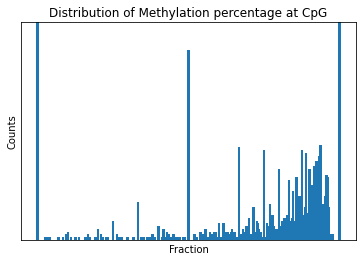

In [96]:
data = info['Fraction'].value_counts()
counts = data.values
fraction = data.index
plt.bar(array(fraction, dtype=float),counts)
ylim(0,80)
xlabel('Fraction')
ylabel('Counts')
yticks([])
xticks([])
title('Distribution of Methylation percentage at CpG')
plt.show()

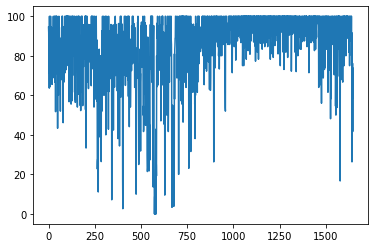

In [93]:
testing = info[info['Coverage'].astype(int)>5]
plt.plot(range(testing.shape[0]),array(testing['Fraction'], dtype=float))

In [103]:
#test = df[df['chrom']=='chr18q']
#info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns = Info_columns)
#testing = info[info['Coverage'].astype(int)>5]
#plt.plot(range(testing.shape[0]),array(testing['Fraction'], dtype=float))

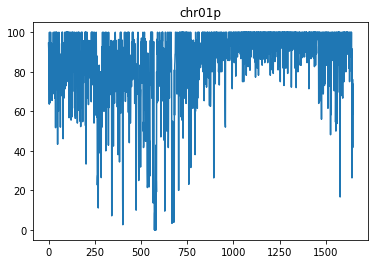

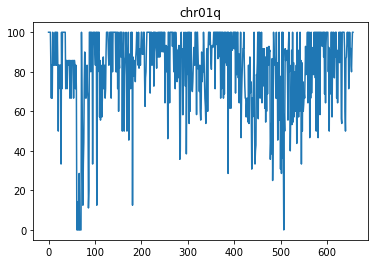

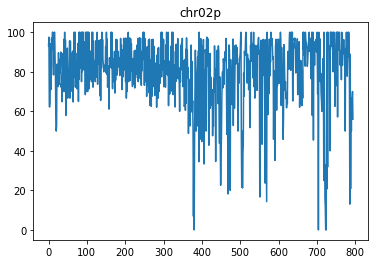

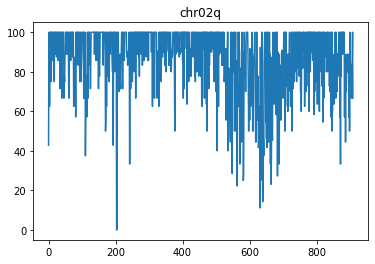

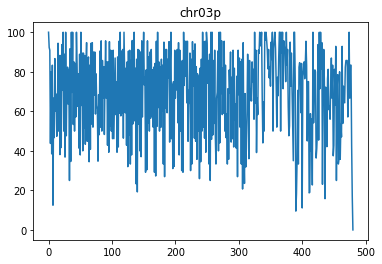

...

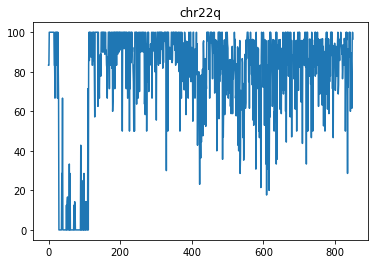

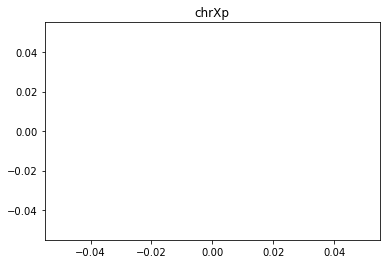

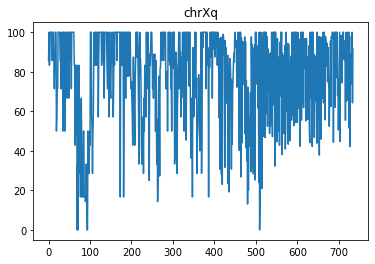

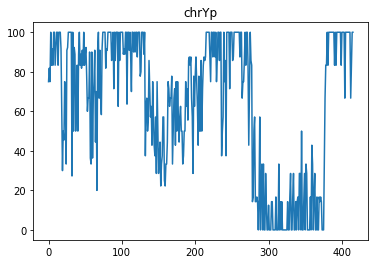

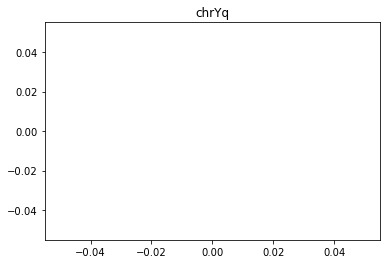

In [102]:
for chrom in sort(df['chrom'].value_counts().index):
    test = df[df['chrom']==chrom]
    info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns = Info_columns)
    testing = info[info['Coverage'].astype(int)>5]
    plt.plot(range(testing.shape[0]),array(testing['Fraction'], dtype=float))
    title(chrom)
    plt.show()

In [34]:
all_arms = ['chr01p', 'chr01q', 'chr02p', 'chr02q', 'chr03p', 'chr03q',
       'chr04p', 'chr04q', 'chr05p', 'chr05q', 'chr06p', 'chr06q',
       'chr07p', 'chr07q', 'chr08p','chr08q' ,'chr09p', 'chr09q', 
            'chr10p',
       'chr10q', 'chr11p', 'chr11q', 'chr12p', 'chr12q', 'chr13p',
       'chr13q','chr14p', 'chr14q', 'chr15p', 'chr15q', 'chr16p', 'chr16q',
       'chr17p', 'chr17q', 'chr18p', 'chr18q', 'chr19p', 'chr19q',
       'chr20p', 'chr20q', 'chr21p', 'chr21q', 'chr22p', 'chr22q']
almost_all_arms = ['chr01p', 'chr01q', 'chr02p', 'chr02q', 'chr03p', 'chr03q',
       'chr04p', 'chr04q', 'chr05p', 'chr05q',  'chr06q',
       'chr07p', 'chr07q', 'chr08p','chr08q' ,'chr09p', 'chr09q', 
            'chr10p',
       'chr10q', 'chr11p', 'chr11q', 'chr12p', 'chr12q', 'chr13p',
       'chr13q','chr14q', 'chr15p', 'chr15q', 'chr16p', 'chr16q',
       'chr17p', 'chr17q', 'chr18q', 'chr19p', 'chr19q',
       'chr20p', 'chr20q', 'chr21p', 'chr21q', 'chr22p', 'chr22q']

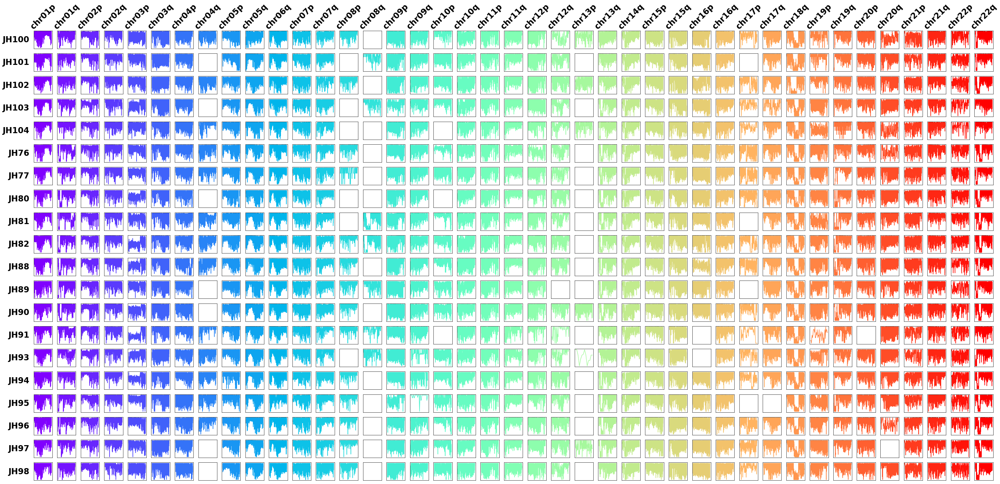

In [142]:
# Define the number of chromosome arms expected
num_chrom_arms = 41 #44

# Define a list of colors
colors = plt.cm.rainbow(np.linspace(0, 1, num_chrom_arms))  # Using the viridis colormap

# Create a 20x44 grid of plots
fig, axs = plt.subplots(20, num_chrom_arms, figsize=(41, 20))  # Adjust figsize as needed

# Remove xticks and yticks from each subplot
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])

# Loop through samples and chromosomes
for i, sample in enumerate(samples):
    df = pd.read_csv(sample, sep='\t', names=columns)
    #sorted_chromosomes = sorted([chrom for chrom in df['chrom'].unique() if 'X' not in chrom and 'Y' not in chrom])

    # Set row label (sample name)
    axs[i, 0].annotate(sample.split('.')[0], xy=(0, 0.5), xytext=(-axs[i, 0].yaxis.labelpad - 5, 0),
                        xycoords=axs[i, 0].yaxis.label, textcoords='offset points',
                        size='large', ha='right', va='center', fontsize=24, fontweight='bold')

    for j, chrom in enumerate(almost_all_arms):
        if j >= num_chrom_arms:
            print(f"Warning: More than {num_chrom_arms} chromosome arms found. Skipping extra chromosomes.")
            break

        # Plot data with color
        test = df[df['chrom'] == chrom]
        info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)
        testing = info[info['Coverage'].astype(int) > 5]
        axs[i, j].plot(range(testing.shape[0]), testing['Fraction'].astype(float), color=colors[j])

        # Set column title on the first row
        if i == 0:
            axs[i, j].set_title(chrom, fontsize=24, rotation=45, fontweight='bold')

# Adjust layout and save the figure with high resolution
plt.tight_layout()
plt.savefig('chromosomes41.png', format='png', dpi=500)  # Increase dpi for higher resolution
plt.savefig('chromosomes41.pdf', format='pdf', dpi=500)  # Increase dpi for higher resolution
plt.show()

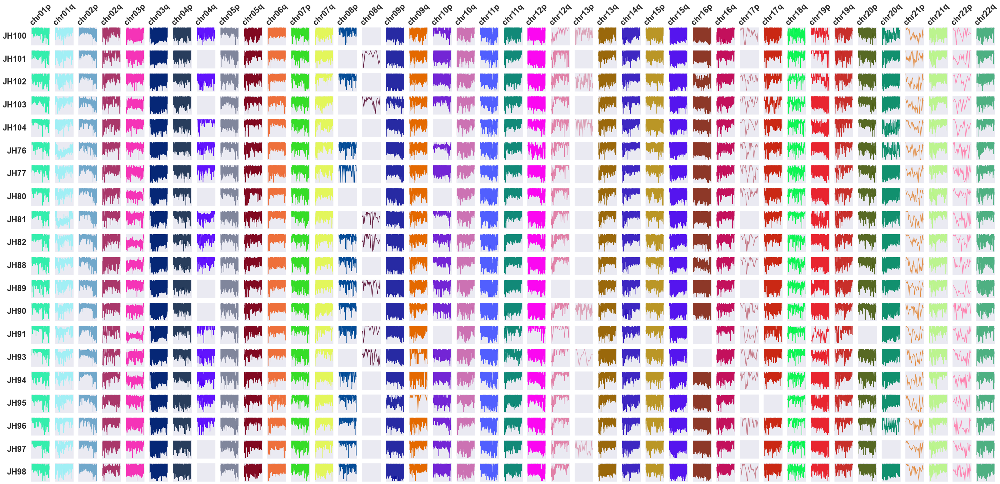

In [153]:
#DISTAL 2kb 
# Define the number of chromosome arms expected
num_chrom_arms = 41 #44

# Define a list of colors
#colors = plt.cm.rainbow(np.linspace(0, 1, num_chrom_arms))  # Using the viridis colormap
colors = np.random.rand(num_chrom_arms, 3)

# Create a 20x44 grid of plots
fig, axs = plt.subplots(20, num_chrom_arms, figsize=(41, 20))  # Adjust figsize as needed

# Remove xticks and yticks from each subplot
for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])

# Loop through samples and chromosomes
for i, sample in enumerate(samples):
    df = pd.read_csv(sample, sep='\t', names=columns)
    #sorted_chromosomes = sorted([chrom for chrom in df['chrom'].unique() if 'X' not in chrom and 'Y' not in chrom])

    # Set row label (sample name)
    axs[i, 0].annotate(sample.split('.')[0], xy=(0, 0.5), xytext=(-axs[i, 0].yaxis.labelpad - 5, 0),
                        xycoords=axs[i, 0].yaxis.label, textcoords='offset points',
                        size='large', ha='right', va='center', fontsize=24, fontweight='bold')

    for j, chrom in enumerate(almost_all_arms):
        if j >= num_chrom_arms:
            print(f"Warning: More than {num_chrom_arms} chromosome arms found. Skipping extra chromosomes.")
            break

        # Plot data with color
        test = df[df['chrom'] == chrom]
        if 'p' in chrom:
            test = test[test['end']<2000]
        else:
            test = test[test['start']>498000]
        
        info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)
        testing = info[info['Coverage'].astype(int) > 5]
        axs[i, j].plot(range(testing.shape[0]), testing['Fraction'].astype(float), color=colors[j])

        # Set column title on the first row
        if i == 0:
            axs[i, j].set_title(chrom, fontsize=24, rotation=45, fontweight='bold')

# Adjust layout and save the figure with high resolution
plt.tight_layout()
plt.savefig('Distal41.png', format='png', dpi=500)  # Increase dpi for higher resolution
plt.savefig('Distal41.pdf', format='pdf', dpi=500)  # Increase dpi for higher resolution
plt.show()

In [59]:
meth = []
for i, sample in enumerate(samples):
    df = pd.read_csv(sample, sep='\t', names=columns)
    chrom ='chr03p'
    test = df[df['chrom'] == chrom]
    if 'p' in chrom:
        test = test[test['end']<2000]
    info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)
    info = info[info['Coverage'].astype(int)>4]
    #print(sample, info.shape[0], int(info['Fraction'].astype(float).median()))
    meth.append(int(info['Fraction'].astype(float).median()))

In [69]:
import pandas as pd

data = {
    'chrom': ['03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p', '03p'],
    'length': [4690.5, 4897.0, 5070.0, 5313.0, 5671.0, 5874.5, 5942.0, 6074.0, 6207.5, 6266.0, 6732.5, 6787.0, 6875.5, 6939.5, 7276.0, 7912.5, 8470.0, 8580.0, 8840.0, 9510.0],
    'Qual': [60.0]*20,
    'Read_length': [15315.5, 20153.0, 21297.0, 21484.5, 20333.0, 21087.0, 18993.0, 23583.0, 17397.0, 22935.0, 22954.5, 17434.5, 19701.5, 17363.5, 19394.0, 19013.5, 22930.5, 19397.0, 22817.0, 23167.0],
    'Sample': ['JH91', 'JH93', 'JH94', 'JH82', 'JH103', 'JH96', 'JH88', 'JH80', 'JH77', 'JH81', 'JH97', 'JH90', 'JH95', 'JH102', 'JH76', 'JH104', 'JH89', 'JH100', 'JH98', 'JH101']
}

data = pd.DataFrame(data)
data = data.set_index('Sample')
data = data.loc[[s.split('.bed')[0] for s in samples]]
data['Meth'] = meth

In [90]:
y

Sample
JH100    73
JH101    83
JH102    80
JH103    61
JH104    86
JH76     80
JH77     76
JH80     61
JH81     77
JH82     52
JH88     63
JH89     80
JH90     66
JH91     40
JH93     66
JH94     66
JH95     81
JH96     87
JH97     80
JH98     78
Name: Meth, dtype: int64

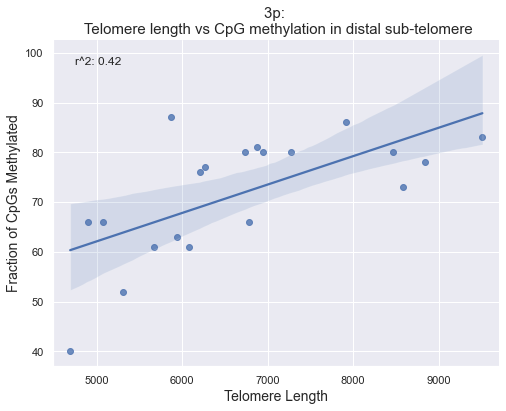

In [110]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

sns.set()

# Assuming 'data' is your DataFrame with 'length' and 'Meth' columns
X = data['length']
y = data['Meth']

# Perform linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(X, y)

# Calculate R-squared
r_squared = r_value**2

# Creating a scatter plot with a regression line using Seaborn
plt.figure(figsize=(8, 6))
ax = sns.regplot(x='length', y='Meth', data=data)

# Setting the title and labels
plt.title('3p: \n Telomere length vs CpG methylation in distal sub-telomere', fontsize = 15)
plt.xlabel('Telomere Length', fontsize = 14)
plt.ylabel('Fraction of CpGs Methylated', fontsize = 14)

# Annotate the plot with R-squared value
plt.text(0.05, 0.95, f'r^2: {r_squared:.2f}', ha='left', va='top', 
         transform=plt.gca().transAxes, fontsize = 12)

xlim(min(X)-200, max(X)+200)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.show()


In [94]:
def telomere_length(chrom, cigar, pos):
    """
    Get the soft clipping to 3' or 5' prime
    """
    if 'p' in chrom:
        return int(cigar.split('=')[0].split('S')[0]) - int(pos)
    else:
        return int(cigar.split('=')[-1].split('S')[0]) - int(pos)
    
def make_dic(bed):
    bed_dic = {}
    for index, row in bed.iterrows():
        bed_dic[row[3]] = [row[1], row[2]]
    return bed_dic

def get_distance_from_end(chrom, read, bed_dic):
    if 'p' in chrom:
        return bed_dic[read][0]
    else:
        return 500000 - bed_dic[read][1]

Sam_files = !ls *sam
masterdf = pd.DataFrame()
ALL = pd.DataFrame()
for sample in Sam_files :
    chrom = []
    length = []
    total_length = []
    QD = []
    bed = pd.read_csv('BEDS/'+sample.split('.')[0]+'.bam.bed', sep ='\t', header = None)
    bed_dic = make_dic(bed)
    
    df = pd.read_csv(sample, sep ='\t',header= None,names=range(24) )
    for i in range(df.shape[0]):
        if df.loc[i][2]!= '*':
            distance = get_distance_from_end(df.loc[i][2], df.loc[i][0], bed_dic)
            telo_length = telomere_length(df.loc[i][2],df.loc[i][5], distance)
            if telo_length > 0:
                length.append(telo_length)
                chrom.append(df.loc[i][2])
                QD.append(df.loc[i][4])
                total_length.append(len(df.loc[i][9]))
    
    DF = pd.DataFrame()
    DF['chrom'] = chrom
    DF['length'] = length
    DF['Qual'] = QD
    DF['Read_length'] = total_length
    DF1 = DF.copy() #NONGrouped
    DF = DF.groupby(['chrom']).median()
    DF['Sample'] = [sample.split('.')[0] for i in range(DF.shape[0])]
    masterdf = pd.concat([masterdf, DF])
    ALL =  pd.concat([ALL, DF1])
    print(sample)
masterdf = masterdf.reset_index()
ALL = ALL.reset_index()     

JH100.sorted.sam
JH101.sorted.sam
JH102.sorted.sam
JH103.sorted.sam
JH104.sorted.sam
JH76.sorted.sam
JH77.sorted.sam
JH80.sorted.sam
JH81.sorted.sam
JH82.sorted.sam
JH88.sorted.sam
JH89.sorted.sam
JH90.sorted.sam
JH91.sorted.sam
JH93.sorted.sam
JH94.sorted.sam
JH95.sorted.sam
JH96.sorted.sam
JH97.sorted.sam
JH98.sorted.sam


In [119]:
masterdf=masterdf[masterdf['chrom']!='chrYp']
masterdf=masterdf[masterdf['chrom']!='chrYq']
masterdf=masterdf[masterdf['chrom']!='chrXq']
masterdf=masterdf[masterdf['chrom']!='chrXp']
masterdf=masterdf[masterdf['chrom']!='chr18p']
masterdf=masterdf[masterdf['chrom']!='chr06p']

#masterdf['chrom'] = masterdf['chrom'].cat.remove_categories(['chrYp'])
#masterdf['chrom'] = masterdf['chrom'].cat.remove_categories(['chrXp'])
#masterdf['chrom'] = masterdf['chrom'].cat.remove_categories(['chrXq'])
#masterdf['chrom'] = masterdf['chrom'].cat.remove_categories(['chrYq'])
#masterdf['chrom'] = masterdf['chrom'].cat.remove_categories(['chr18p'])
#masterdf['chrom'] = masterdf['chrom'].cat.remove_categories(['chr06p'])

chr15p


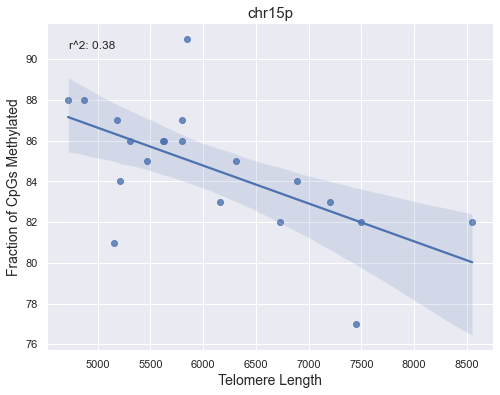

chr10p


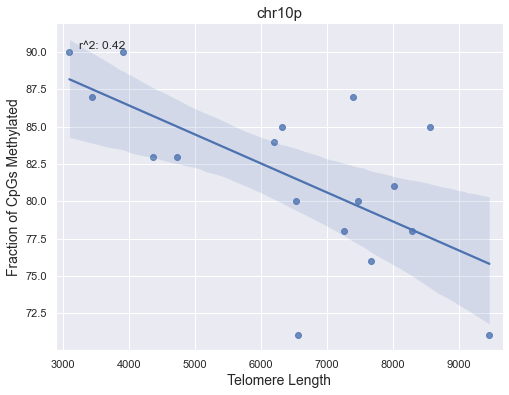

chr03p


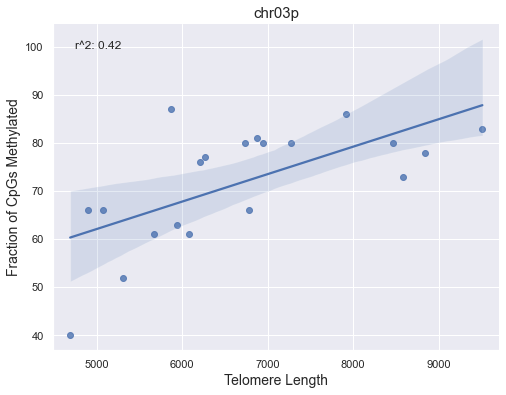

chr05q


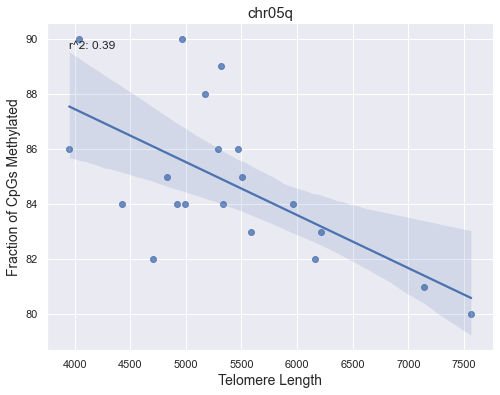

chr01p


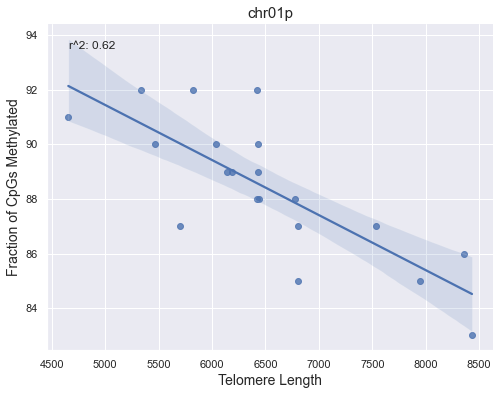

chr08p


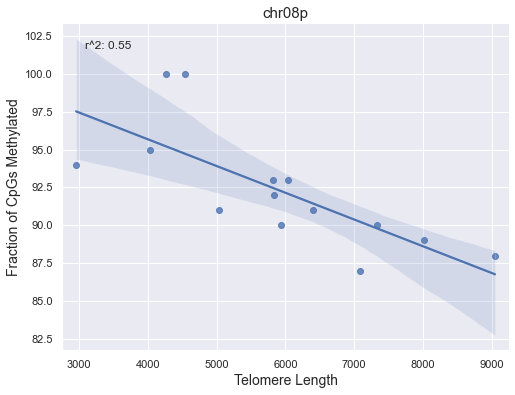

In [151]:
for chrom in masterdf['chrom'].value_counts().index:



    meth = []
    sample_list = []
    for i, sample in enumerate(samples):
        df = pd.read_csv(sample, sep='\t', names=columns)
        #chrom ='chr03p'
        test = df[df['chrom'] == chrom]
        if 'p' in chrom:
            test = test[test['end']<2000]
        else:
            test = test[test['start']>498000]
        info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)
        info = info[info['Coverage'].astype(int)>4]
        if info.shape[0]> 0:
        #print(sample, info.shape[0], int(info['Fraction'].astype(float).median()))
            meth.append(int(info['Fraction'].astype(float).median()))
            sample_list.append(sample.split('.')[0])


    data = masterdf[masterdf['chrom']==chrom]
    data = data.set_index('Sample')
    sample_list_new = [s for s in sample_list if s in list(data.index)]
    new_meth = []
    for ind, i in enumerate(sample_list):
        if i in list(data.index):
            new_meth.append(meth[ind])
            
    data = data.loc[sample_list_new]
    data['Meth'] = new_meth

    # Assuming 'data' is your DataFrame with 'length' and 'Meth' columns
    X = data['length']
    y = data['Meth']

    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(X, y)

    # Calculate R-squared
    r_squared = r_value**2
    if r_squared > 0.30:

        # Creating a scatter plot with a regression line using Seaborn
        plt.figure(figsize=(8, 6))
        ax = sns.regplot(x='length', y='Meth', data=data)

        # Setting the title and labels
        plt.title(f'{chrom}', fontsize = 15)
        #plt.title(f'{chrom}: \n Telomere length vs CpG methylation in distal sub-telomere', fontsize = 15)
        plt.xlabel('Telomere Length', fontsize = 14)
        plt.ylabel('Fraction of CpGs Methylated', fontsize = 14)

        # Annotate the plot with R-squared value
        plt.text(0.05, 0.95, f'r^2: {r_squared:.2f}', ha='left', va='top', 
                 transform=plt.gca().transAxes, fontsize = 12)

        xlim(min(X)-200, max(X)+200)

        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        print(chrom)
        plt.show()

chr15p


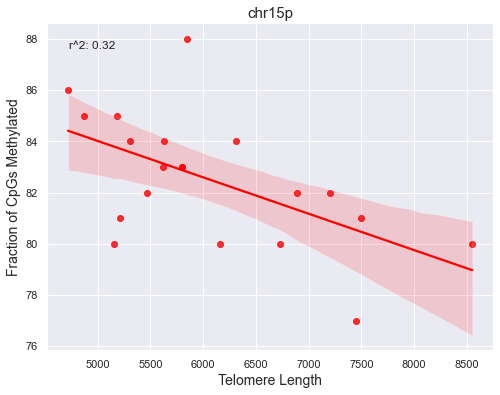

chr16q


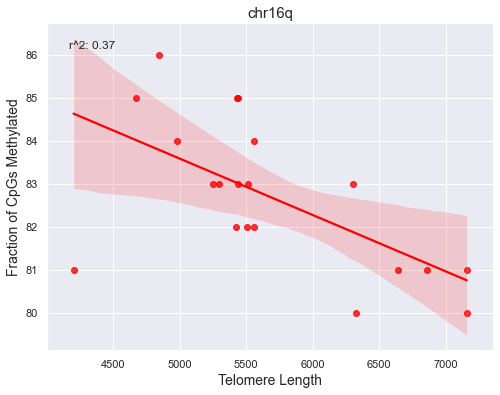

chr10p


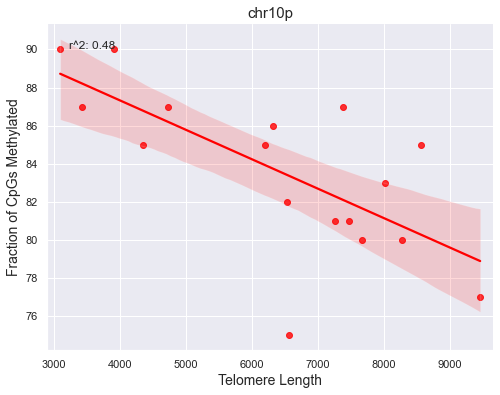

chr03p


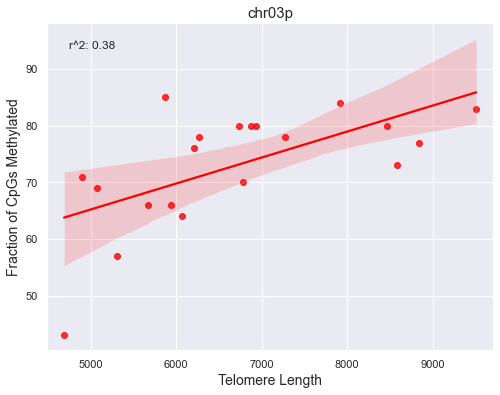

chr05q


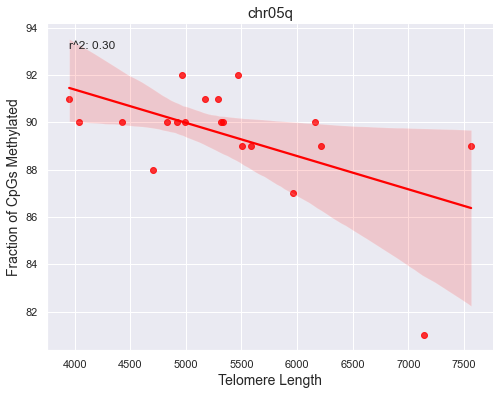

chr13q


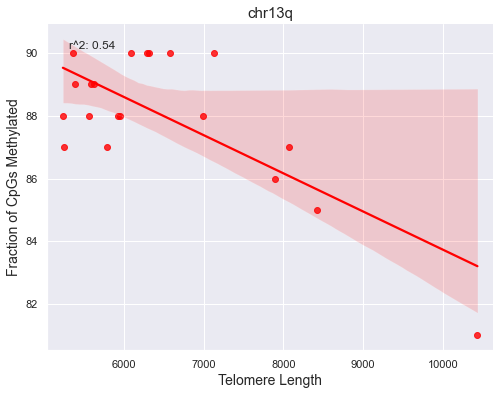

chr01p


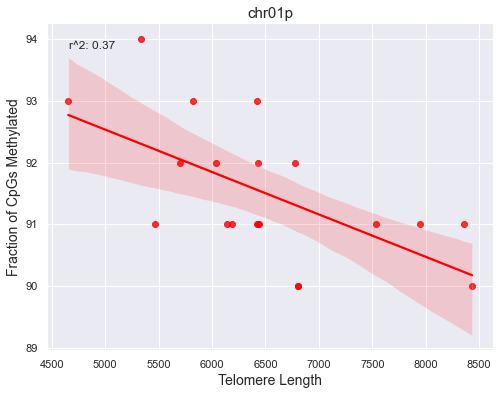

chr20p


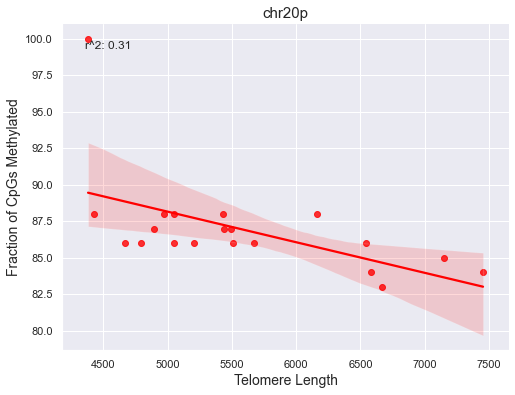

chr13p


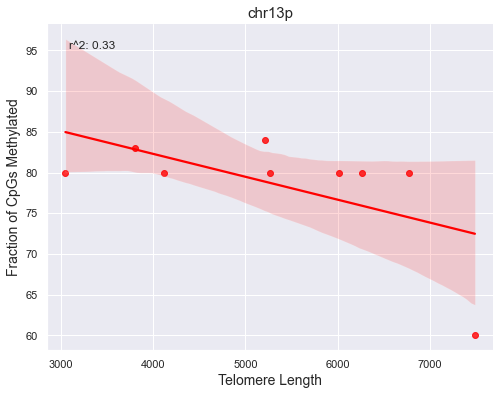

chr14p


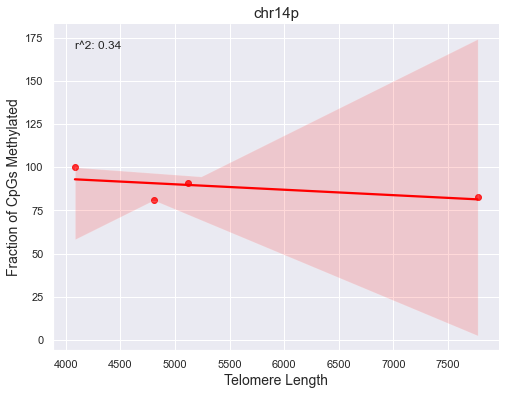

In [152]:
for chrom in masterdf['chrom'].value_counts().index:



    meth = []
    sample_list = []
    for i, sample in enumerate(samples):
        df = pd.read_csv(sample, sep='\t', names=columns)
        #chrom ='chr03p'
        test = df[df['chrom'] == chrom]
       
        info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)
        info = info[info['Coverage'].astype(int)>4]
        if info.shape[0]> 0:
        #print(sample, info.shape[0], int(info['Fraction'].astype(float).median()))
            meth.append(int(info['Fraction'].astype(float).median()))
            sample_list.append(sample.split('.')[0])


    data = masterdf[masterdf['chrom']==chrom]
    data = data.set_index('Sample')
    sample_list_new = [s for s in sample_list if s in list(data.index)]
    new_meth = []
    for ind, i in enumerate(sample_list):
        if i in list(data.index):
            new_meth.append(meth[ind])
            
    data = data.loc[sample_list_new]
    data['Meth'] = new_meth

    # Assuming 'data' is your DataFrame with 'length' and 'Meth' columns
    X = data['length']
    y = data['Meth']

    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(X, y)

    # Calculate R-squared
    r_squared = r_value**2
    if r_squared > 0.30:

        # Creating a scatter plot with a regression line using Seaborn
        plt.figure(figsize=(8, 6))
        ax = sns.regplot(x='length', y='Meth', data=data, color ='red')

        # Setting the title and labels
        plt.title(f'{chrom}', fontsize = 15)
        #plt.title(f'{chrom}: \n Telomere length vs CpG methylation in distal sub-telomere', fontsize = 15)
        plt.xlabel('Telomere Length', fontsize = 14)
        plt.ylabel('Fraction of CpGs Methylated', fontsize = 14)

        # Annotate the plot with R-squared value
        plt.text(0.05, 0.95, f'r^2: {r_squared:.2f}', ha='left', va='top', 
                 transform=plt.gca().transAxes, fontsize = 12)

        xlim(min(X)-200, max(X)+200)

        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        print(chrom)
        plt.show()

In [178]:
info

,Coverage,Fraction,Mod,Canonical,Other,Delete,Fail,Diff,nocall
0,1,100.00,1,0,0,0,0,0,0
1,1,100.00,1,0,0,0,0,0,0
2,1,100.00,1,0,0,0,0,0,0
3,1,100.00,1,0,0,0,0,0,0
4,1,100.00,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
2238,10,60.00,6,4,0,0,1,1,2
2239,15,100.00,15,0,0,1,2,0,1
2240,7,57.14,4,3,0,1,3,2,1
2241,15,100.00,15,0,0,0,1,0,3


In [204]:
almost_all_arms = ['chr01p', 'chr01q', 'chr02p', 'chr02q', 'chr03p', 'chr03q',
       'chr04p', 'chr04q', 'chr05p', 'chr05q',  'chr06q',
       'chr07p', 'chr07q','chr08q' ,'chr09p', 'chr09q', 
            'chr10p',
       'chr10q', 'chr11p', 'chr11q', 'chr12p', 'chr12q', 'chr13p',
       'chr13q','chr14q', 'chr15p', 'chr15q', 'chr16p', 'chr16q',
       'chr17p', 'chr17q', 'chr18q', 'chr19p', 'chr19q',
       'chr20p', 'chr20q', 'chr21p', 'chr21q', 'chr22p', 'chr22q']

41

IndexError: index 8 is out of bounds for axis 0 with size 8

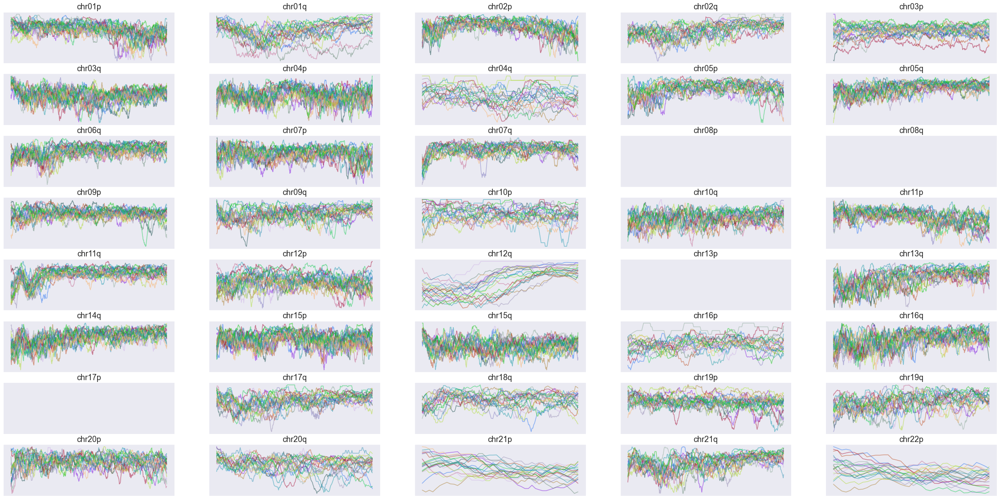

In [213]:
from functools import reduce
colors = np.random.rand(len(samples), 3)

nrows, ncols = 8, 5  # 8 rows and 5 columns for 40 plots

# Create a figure and a grid of subplots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 20))  # Adjust the figure size as needed



for ind, chrom in enumerate(almost_all_arms):
    list_of_dfs = []
    for sample in samples:
        df = pd.read_csv(sample, sep='\t', names=columns)
        test = df[df['chrom'] == chrom]
        if 'p' in chrom:
            test = test[test['end']<2000]
        else:
            test = test[test['start']>498000]
        testing = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)

        #testing = info[info['Coverage'].astype(int) > 4]
        #axs[i, j].plot(range(testing.shape[0]), testing['Fraction'].astype(float), color=colors[j])


        list_of_dfs.append(testing) 

    # Find the intersection of indexes of all dataframes
    common_indexes = reduce(lambda x, y: x.intersection(y.index), list_of_dfs, list_of_dfs[0].index)
    # Filter each dataframe to keep only rows with these common indexes
    filtered_dfs = [df.loc[common_indexes] for df in list_of_dfs]

    
    count = 0 
    row = ind // ncols  # Integer division to find the row
    col = ind % ncols   # Modulo operation to find the column

    for testing in filtered_dfs:

        # Assuming 'data' is your DataFrame with 'position' and 'methylation' columns
        # Example: data = pd.DataFrame({'position': [...], 'methylation': [...]})

        # Set the window size for the rolling mean
        window_size = 20  # This can be adjusted based on your data

        # Calculate the rolling mean
        testing['smoothed_methylation'] = testing['Fraction'].rolling(window=window_size, min_periods=1, center=True).mean()

        # Plotting
        #plt.figure(figsize=(10, 6))
        axs[row, col].plot(range(testing.shape[0]), testing['smoothed_methylation'], 
                 label=samples[count].split('.')[0], color= colors[count], alpha =.5)
        #plt.scatter(range(testing.shape[0]), testing['Fraction'], alpha=0.3, label='Original Methylation', color='gray')
        #print(range(testing.shape[0]), sample)
        count +=1
    axs[row, col].set_xticks([])
    axs[row, col].set_yticks([])

    axs[row, col].set_title(chrom, fontsize = 18)
    #plt.xlabel('Position')
    #plt.ylabel('Methylation (%)')
    # 
    #plt.legend()    
plt.tight_layout()
plt.show()

IndexError: index 8 is out of bounds for axis 0 with size 8

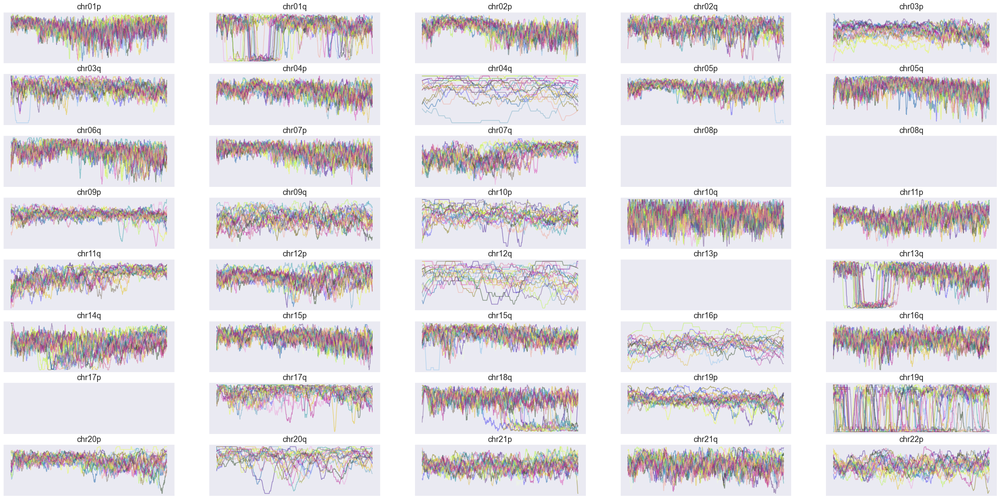

In [214]:
from functools import reduce
colors = np.random.rand(len(samples), 3)

nrows, ncols = 8, 5  # 8 rows and 5 columns for 40 plots

# Create a figure and a grid of subplots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 20))  # Adjust the figure size as needed



for ind, chrom in enumerate(almost_all_arms):
    list_of_dfs = []
    for sample in samples:
        df = pd.read_csv(sample, sep='\t', names=columns)
        test = df[df['chrom'] == chrom]
        #if 'p' in chrom:
        #    test = test[test['end']<2000]
        #else:
        #    test = test[test['start']>498000]
        testing = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)

        #testing = info[info['Coverage'].astype(int) > 4]
        #axs[i, j].plot(range(testing.shape[0]), testing['Fraction'].astype(float), color=colors[j])


        list_of_dfs.append(testing) 

    # Find the intersection of indexes of all dataframes
    common_indexes = reduce(lambda x, y: x.intersection(y.index), list_of_dfs, list_of_dfs[0].index)
    # Filter each dataframe to keep only rows with these common indexes
    filtered_dfs = [df.loc[common_indexes] for df in list_of_dfs]

    
    count = 0 
    row = ind // ncols  # Integer division to find the row
    col = ind % ncols   # Modulo operation to find the column

    for testing in filtered_dfs:

        # Assuming 'data' is your DataFrame with 'position' and 'methylation' columns
        # Example: data = pd.DataFrame({'position': [...], 'methylation': [...]})

        # Set the window size for the rolling mean
        window_size = 20  # This can be adjusted based on your data

        # Calculate the rolling mean
        testing['smoothed_methylation'] = testing['Fraction'].rolling(window=window_size, min_periods=1, center=True).mean()

        # Plotting
        #plt.figure(figsize=(10, 6))
        axs[row, col].plot(range(testing.shape[0]), testing['smoothed_methylation'], 
                 label=samples[count].split('.')[0], color= colors[count], alpha =.5)
        #plt.scatter(range(testing.shape[0]), testing['Fraction'], alpha=0.3, label='Original Methylation', color='gray')
        #print(range(testing.shape[0]), sample)
        count +=1
    axs[row, col].set_xticks([])
    axs[row, col].set_yticks([])

    axs[row, col].set_title(chrom, fontsize = 18)
    #plt.xlabel('Position')
    #plt.ylabel('Methylation (%)')
    # 
    #plt.legend()    
plt.tight_layout()
plt.show()

In [224]:
sorted_series = masterdf[masterdf['chrom'] == 'chr01p'].sort_values('length')['Sample']

# Get the first four values
first_four = list(sorted_series.head(4))

# Get the last four values
last_four = list(sorted_series.tail(4))



['JH101', 'JH100', 'JH89', 'JH98', 'JH91', 'JH93', 'JH96', 'JH103']

IndexError: index 8 is out of bounds for axis 0 with size 8

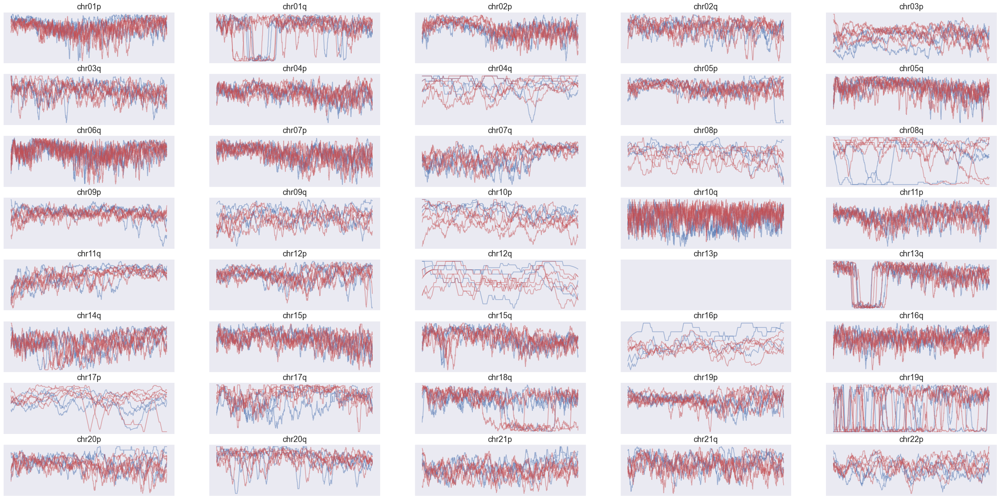

In [239]:
from functools import reduce
#colors = np.random.rand(len(samples), 3)

nrows, ncols = 8, 5  # 8 rows and 5 columns for 40 plots

# Create a figure and a grid of subplots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 20))  # Adjust the figure size as needed



for ind, chrom in enumerate(almost_all_arms):
    sorted_series = masterdf[masterdf['chrom'] == chrom].sort_values('length')['Sample']
    # Get the first four values
    first_four = list(sorted_series.head(4))
    # Get the last four values
    last_four = list(sorted_series.tail(4))
    
    list_of_dfs = []
    for sample in first_four+last_four:
        df = pd.read_csv(sample+'.bed', sep='\t', names=columns)
        test = df[df['chrom'] == chrom]
        #if 'p' in chrom:
        #    test = test[test['end']<2000]
        #else:
        #    test = test[test['start']>498000]
        testing = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)

        #testing = info[info['Coverage'].astype(int) > 4]
        #axs[i, j].plot(range(testing.shape[0]), testing['Fraction'].astype(float), color=colors[j])


        list_of_dfs.append(testing) 

    # Find the intersection of indexes of all dataframes
    common_indexes = reduce(lambda x, y: x.intersection(y.index), list_of_dfs, list_of_dfs[0].index)
    # Filter each dataframe to keep only rows with these common indexes
    filtered_dfs = [df.loc[common_indexes] for df in list_of_dfs]

    
     
    row = ind // ncols  # Integer division to find the row
    col = ind % ncols   # Modulo operation to find the column
    count = 0
    for testing in filtered_dfs:
        

        # Assuming 'data' is your DataFrame with 'position' and 'methylation' columns
        # Example: data = pd.DataFrame({'position': [...], 'methylation': [...]})

        # Set the window size for the rolling mean
        window_size = 20  # This can be adjusted based on your data

        # Calculate the rolling mean
        testing['smoothed_methylation'] = testing['Fraction'].rolling(window=window_size, min_periods=1, center=True).mean()

        # Plotting
        #plt.figure(figsize=(10, 6))
        if count < 3:
            axs[row, col].plot(range(testing.shape[0]), testing['smoothed_methylation'], 
                     label=samples[count].split('.')[0], color= 'b', alpha =.5)
        else:
            axs[row, col].plot(range(testing.shape[0]), testing['smoothed_methylation'], 
                     label=samples[count].split('.')[0], color= 'r', alpha =.5)
        #plt.scatter(range(testing.shape[0]), testing['Fraction'], alpha=0.3, label='Original Methylation', color='gray')
        #print(range(testing.shape[0]), sample)
        count +=1
    axs[row, col].set_xticks([])
    axs[row, col].set_yticks([])

    axs[row, col].set_title(chrom, fontsize = 18)
    #plt.xlabel('Position')
    #plt.ylabel('Methylation (%)')
    # 
    #plt.legend()    
plt.tight_layout()
plt.show()

IndexError: index 8 is out of bounds for axis 0 with size 8

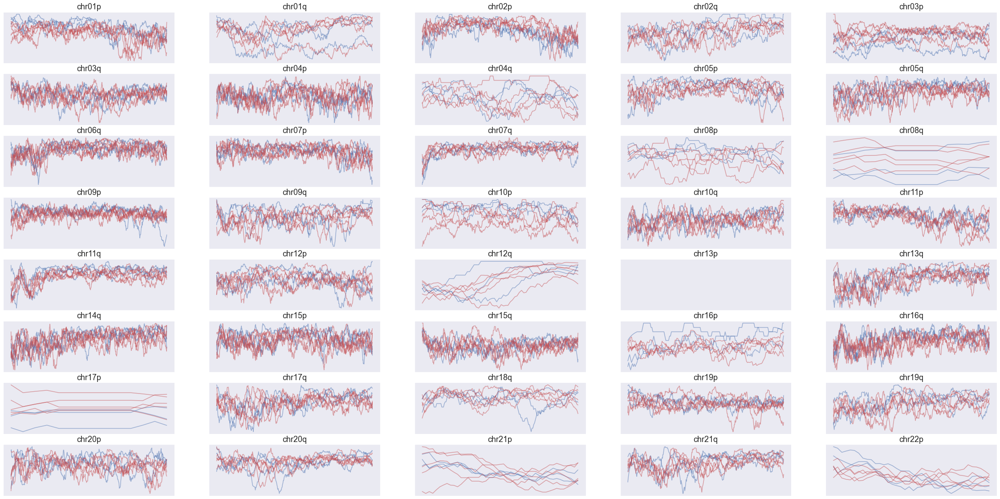

In [238]:
from functools import reduce
#colors = np.random.rand(len(samples), 3)

nrows, ncols = 8, 5  # 8 rows and 5 columns for 40 plots

# Create a figure and a grid of subplots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 20))  # Adjust the figure size as needed



for ind, chrom in enumerate(almost_all_arms):
    sorted_series = masterdf[masterdf['chrom'] == chrom].sort_values('length')['Sample']
    # Get the first four values
    first_four = list(sorted_series.head(4))
    # Get the last four values
    last_four = list(sorted_series.tail(4))
    
    list_of_dfs = []
    for sample in first_four+last_four:
        df = pd.read_csv(sample+'.bed', sep='\t', names=columns)
        test = df[df['chrom'] == chrom]
        if 'p' in chrom:
            test = test[test['end']<2000]
        else:
            test = test[test['start']>498000]
        testing = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)

        #testing = info[info['Coverage'].astype(int) > 4]
        #axs[i, j].plot(range(testing.shape[0]), testing['Fraction'].astype(float), color=colors[j])


        list_of_dfs.append(testing) 

    # Find the intersection of indexes of all dataframes
    common_indexes = reduce(lambda x, y: x.intersection(y.index), list_of_dfs, list_of_dfs[0].index)
    # Filter each dataframe to keep only rows with these common indexes
    filtered_dfs = [df.loc[common_indexes] for df in list_of_dfs]

    
     
    row = ind // ncols  # Integer division to find the row
    col = ind % ncols   # Modulo operation to find the column
    count = 0
    for testing in filtered_dfs:
        

        # Assuming 'data' is your DataFrame with 'position' and 'methylation' columns
        # Example: data = pd.DataFrame({'position': [...], 'methylation': [...]})

        # Set the window size for the rolling mean
        window_size = 20  # This can be adjusted based on your data

        # Calculate the rolling mean
        testing['smoothed_methylation'] = testing['Fraction'].rolling(window=window_size, min_periods=1, center=True).mean()

        # Plotting
        #plt.figure(figsize=(10, 6))
        if count < 3:
            axs[row, col].plot(range(testing.shape[0]), testing['smoothed_methylation'], 
                     label=samples[count].split('.')[0], color= 'b', alpha =.5)
        else:
            axs[row, col].plot(range(testing.shape[0]), testing['smoothed_methylation'], 
                     label=samples[count].split('.')[0], color= 'r', alpha =.5)
        #plt.scatter(range(testing.shape[0]), testing['Fraction'], alpha=0.3, label='Original Methylation', color='gray')
        #print(range(testing.shape[0]), sample)
        count +=1
    axs[row, col].set_xticks([])
    axs[row, col].set_yticks([])

    axs[row, col].set_title(chrom, fontsize = 18)
    #plt.xlabel('Position')
    #plt.ylabel('Methylation (%)')
    # 
    #plt.legend()    
plt.tight_layout()
plt.show()

In [327]:
median_fraction = []
for ind, chrom in enumerate(almost_all_arms):
    list_of_dfs = []
    for sample in samples:
        df = pd.read_csv(sample, sep='\t', names=columns)
        test = df[df['chrom'] == chrom]
        if 'p' in chrom:
            test = test[test['end']<2000]
        else:
            test = test[test['start']>498000]
        info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)

        testing = info[info['Coverage'].astype(int) > 4]
        #axs[i, j].plot(range(testing.shape[0]), testing['Fraction'].astype(float), color=colors[j])


        list_of_dfs.append(testing) 

    # Find the intersection of indexes of all dataframes
    #common_indexes = reduce(lambda x, y: x.intersection(y.index), list_of_dfs, list_of_dfs[0].index)
    # Filter each dataframe to keep only rows with these common indexes
    #filtered_dfs = [df.loc[common_indexes] for df in list_of_dfs]
    #fraction = [i['Fraction'].median() for i in filtered_dfs]
    fraction = [i['Fraction'].median() for i in list_of_dfs]
    median_fraction.append(median(fraction))
    
    

In [328]:
meth = pd.DataFrame()
meth['Chrom'] = almost_all_arms
meth['Meth']= median_fraction
meth = meth.dropna()

In [329]:
length= masterdf[['chrom', 'length']].groupby('chrom').median()
length = length.loc[meth['Chrom']]
meth['telo_length'] = list(length['length'])

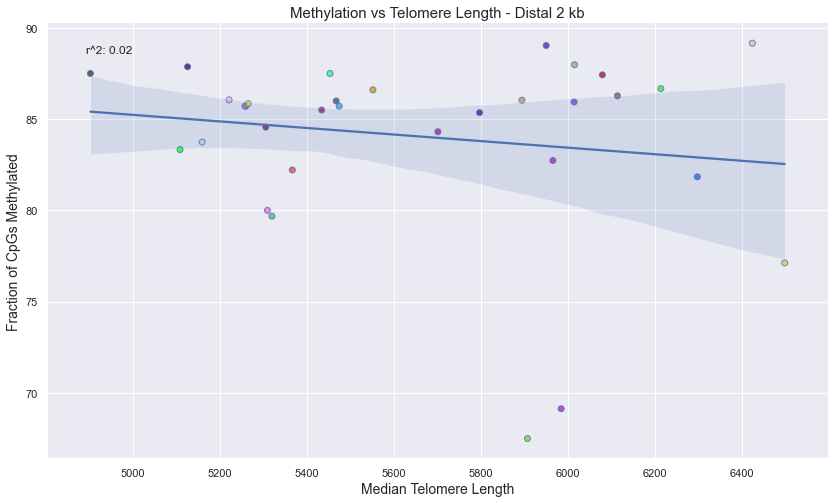

In [330]:
X = meth['telo_length']
y = meth['Meth']

# Perform linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(X, y)

# Calculate R-squared
r_squared = r_value**2
#if r_squared > 0.30:

# Creating a scatter plot with a regression line using Seaborn
plt.figure(figsize=(14, 8))

num_points = meth.shape[0]
colors = np.random.rand(num_points, 3)

ax = sns.regplot(x='telo_length', y='Meth', data=meth, 
                 scatter_kws={'facecolors': colors})

# Setting the title and labels
plt.title('Methylation vs Telomere Length - Distal 2 kb', fontsize = 15)
#plt.title(f'{chrom}: \n Telomere length vs CpG methylation in distal sub-telomere', fontsize = 15)
plt.xlabel('Median Telomere Length', fontsize = 14)
plt.ylabel('Fraction of CpGs Methylated', fontsize = 14)

# Annotate the plot with R-squared value
plt.text(0.05, 0.95, f'r^2: {r_squared:.2f}', ha='left', va='top', 
         transform=plt.gca().transAxes, fontsize = 12)

xlim(min(X)-100, max(X)+100)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

#print(chrom)
plt.show()

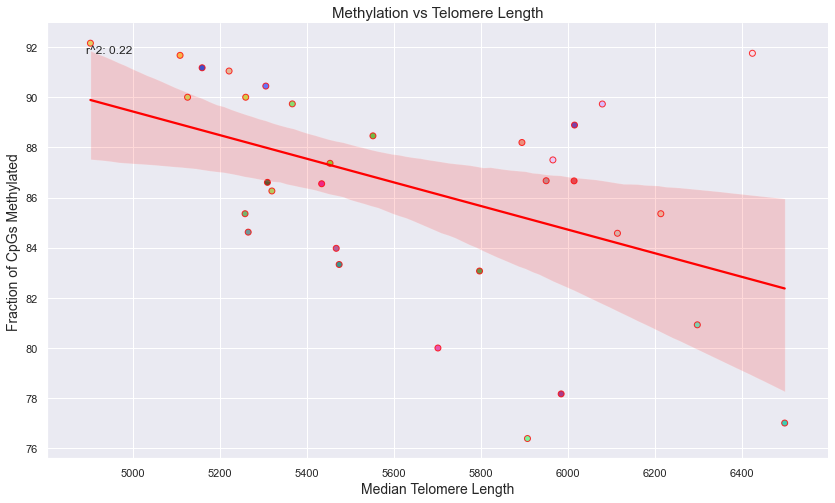

In [331]:
median_fraction = []
for ind, chrom in enumerate(almost_all_arms):
    list_of_dfs = []
    for sample in samples:
        df = pd.read_csv(sample, sep='\t', names=columns)
        test = df[df['chrom'] == chrom]
        
        info = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)

        testing = info[info['Coverage'].astype(int) > 4]
        #axs[i, j].plot(range(testing.shape[0]), testing['Fraction'].astype(float), color=colors[j])


        list_of_dfs.append(testing) 

    # Find the intersection of indexes of all dataframes
    #common_indexes = reduce(lambda x, y: x.intersection(y.index), list_of_dfs, list_of_dfs[0].index)
    # Filter each dataframe to keep only rows with these common indexes
    #filtered_dfs = [df.loc[common_indexes] for df in list_of_dfs]
    fraction = [i['Fraction'].median() for i in list_of_dfs]
    median_fraction.append(median(fraction))
    
meth = pd.DataFrame()
meth['Chrom'] = almost_all_arms
meth['Meth']= median_fraction
meth = meth.dropna() 

length= masterdf[['chrom', 'length']].groupby('chrom').median()
length = length.loc[meth['Chrom']]
meth['telo_length'] = list(length['length'])


X = meth['telo_length']
y = meth['Meth']

# Perform linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(X, y)

# Calculate R-squared
r_squared = r_value**2
#if r_squared > 0.30:

# Creating a scatter plot with a regression line using Seaborn
plt.figure(figsize=(14, 8))

num_points = meth.shape[0]
colors = np.random.rand(num_points, 3)

ax = sns.regplot(x='telo_length', y='Meth', data=meth, 
                 scatter_kws={'facecolors': colors},color ='red')

# Setting the title and labels
plt.title('Methylation vs Telomere Length', fontsize = 15)
#plt.title(f'{chrom}: \n Telomere length vs CpG methylation in distal sub-telomere', fontsize = 15)
plt.xlabel('Median Telomere Length', fontsize = 14)
plt.ylabel('Fraction of CpGs Methylated', fontsize = 14)

# Annotate the plot with R-squared value
plt.text(0.05, 0.95, f'r^2: {r_squared:.2f}', ha='left', va='top', 
         transform=plt.gca().transAxes, fontsize = 12)

xlim(min(X)-100, max(X)+100)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

#print(chrom)
plt.show()

In [340]:
chrlengths = masterdf[['chrom', 'length']].groupby('chrom').median()
chrlengths = chrlengths.loc[almost_all_arms]
sorted_length = chrlengths.sort_values('length')


In [341]:
!SET INDEX AS START POSITION IN TESTING DF

Index(['chr08q', 'chr17q', 'chr17p', 'chr11p', 'chr22q', 'chr15q', 'chr03q',
       'chr13p', 'chr04p', 'chr02q', 'chr07p', 'chr05q', 'chr19p', 'chr09p',
       'chr12p', 'chr20p', 'chr11q', 'chr09q', 'chr16q', 'chr16p', 'chr20q',
       'chr21q', 'chr04q', 'chr10q', 'chr15p', 'chr08p', 'chr19q', 'chr22p',
       'chr14q', 'chr01q', 'chr21p', 'chr02p', 'chr13q', 'chr06q', 'chr05p',
       'chr07q', 'chr18q', 'chr10p', 'chr01p', 'chr03p', 'chr12q'],
      dtype='object', name='chrom')

Index(['chr17q', 'chr17p', 'chr11p', 'chr22q', 'chr15q', 'chr03q', 'chr13p',
       'chr04p', 'chr02q', 'chr07p', 'chr05q', 'chr19p', 'chr09p', 'chr12p',
       'chr20p', 'chr11q', 'chr09q', 'chr16q', 'chr16p', 'chr20q', 'chr21q',
       'chr04q', 'chr10q', 'chr15p', 'chr08p', 'chr19q', 'chr22p', 'chr14q',
       'chr01q', 'chr21p', 'chr02p', 'chr13q', 'chr06q', 'chr05p', 'chr07q',
       'chr18q', 'chr10p', 'chr01p', 'chr03p', 'chr12q'],
      dtype='object', name='chrom')

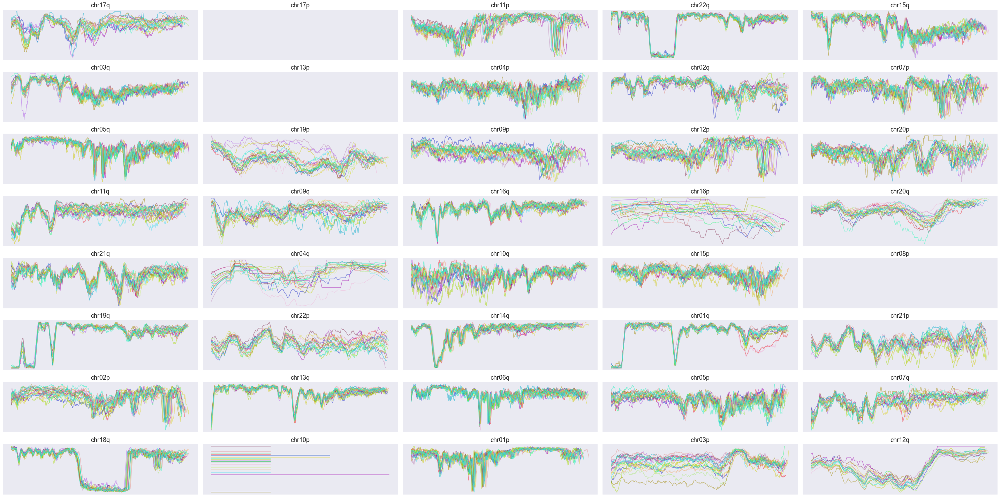

In [355]:
from functools import reduce
colors = np.random.rand(len(samples), 3)

nrows, ncols = 8, 5  # 8 rows and 5 columns for 40 plots

# Create a figure and a grid of subplots
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(40, 20))  # Adjust the figure size as needed



for ind, chrom in enumerate(sorted_length.index[1:]):
    list_of_dfs = []
    for sample in samples:
        df = pd.read_csv(sample, sep='\t', names=columns)
        test =  df[df['chrom'] == chrom].set_index('start') #FIXED!!!
        
        #if 'p' in chrom:
        #    test = test[test['end']<2000]
        #else:
        #    test = test[test['start']>498000]
        testing = pd.DataFrame(test['info'].str.split(' ').tolist(), columns=Info_columns)
        testing.index =  test.index #FIXED!!!

        #testing = info[info['Coverage'].astype(int) > 4]
        #axs[i, j].plot(range(testing.shape[0]), testing['Fraction'].astype(float), color=colors[j])


        list_of_dfs.append(testing) 

    # Find the intersection of indexes of all dataframes
    common_indexes = reduce(lambda x, y: x.intersection(y.index), list_of_dfs, list_of_dfs[0].index)
    # Filter each dataframe to keep only rows with these common indexes
    filtered_dfs = [df.loc[common_indexes] for df in list_of_dfs]

    
    count = 0 
    row = ind // ncols  # Integer division to find the row
    col = ind % ncols   # Modulo operation to find the column

    for testing in filtered_dfs:

        # Assuming 'data' is your DataFrame with 'position' and 'methylation' columns
        # Example: data = pd.DataFrame({'position': [...], 'methylation': [...]})

        # Set the window size for the rolling mean
        window_size = 20  # This can be adjusted based on your data

        # Calculate the rolling mean
        testing['smoothed_methylation'] = testing['Fraction'].rolling(window=window_size, min_periods=1, center=True).mean()

        # Plotting
        #plt.figure(figsize=(10, 6))
        axs[row, col].plot(range(testing.shape[0]), testing['smoothed_methylation'], 
                 label=samples[count].split('.')[0], color= colors[count], alpha =.5)
        #plt.scatter(range(testing.shape[0]), testing['Fraction'], alpha=0.3, label='Original Methylation', color='gray')
        #print(range(testing.shape[0]), sample)
        count +=1
    axs[row, col].set_xticks([])
    axs[row, col].set_yticks([])

    axs[row, col].set_title(chrom, fontsize = 18)
    #plt.xlabel('Position')
    #plt.ylabel('Methylation (%)')
    # 
    #plt.legend()    
plt.tight_layout()
plt.show()

In [354]:
testing

,Coverage,Fraction,Mod,Canonical,Other,Delete,Fail,Diff,nocall
start,,,,,,,,,
18,8,100.00,8,0,0,0,0,0,1
19,7,14.29,1,6,0,1,0,0,1
20,1,0.00,0,1,0,0,0,0,8
109,8,75.00,6,2,0,2,1,0,0
110,6,100.00,6,0,0,0,2,0,1
...,...,...,...,...,...,...,...,...,...
33695,1,100.00,1,0,0,0,0,0,0
33744,1,100.00,1,0,0,0,0,0,0
33804,1,100.00,1,0,0,0,0,0,0
